<a href="https://colab.research.google.com/github/Tee-Sarun/DADS-7202-Deep-Learning/blob/main/project_dl_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GPU + INSTALL**


In [ ]:
!nvidia-smi -L
!pip install torchinfo
!pip install timm
!pip install opencv-python

GPU 0: NVIDIA L4 (UUID: GPU-98da3d84-06ad-66f7-a86e-aa1398268b0b)


# **IMPORT**

In [ ]:
import sys
import random
import time
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import cv2
import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.transforms.v2 as T
from torchvision import datasets, models
from torch.utils.data import DataLoader, Dataset
import math


import timm
import torchinfo

print(f"Python {sys.version}")
print(f"NumPy {np.__version__}")
print(f"PyTorch {torch.__version__}")
print(f"torchvision {torchvision.__version__}")
print(f"torchinfo {torchinfo.__version__}")

Python 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
NumPy 2.0.2
PyTorch 2.10.0+cu128
torchvision 0.25.0+cu128
torchinfo 1.8.0


# **SEED**

In [ ]:
def set_seeds(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seeds()

# **DEVICE**

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

DEVICE: cuda


# **DATASET PATH**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATASET_PATH = "/content/drive/MyDrive/XRAY_SPLIT"

# **TRANSFORM**

In [ ]:
import numpy as np
from PIL import Image

class DualLungCrop:

    def __call__(self, img):

        img = np.array(img)
        h, w = img.shape[:2]

        y1 = int(h * 0.18)
        y2 = int(h * 0.88)

        lung_width = int(w * 0.32)

        xL1 = int(w * 0.05)
        xL2 = xL1 + lung_width

        xR2 = int(w * 0.95)
        xR1 = xR2 - lung_width

        left = img[y1:y2, xL1:xL2]
        right = img[y1:y2, xR1:xR2]

        new = np.concatenate([left, right], axis=1)

        return Image.fromarray(new.astype(np.uint8))

class DualLungFixedROI:
  def __init__(self,
                y1=50,
                y2=300,
                lung_width=182):
      self.y1 = y1
      self.y2 = y2
      self.lung_width = lung_width

  def __call__(self, img):

      img = np.array(img)
      h, w = img.shape[:2]

      mask = np.zeros((h, w), dtype=np.float32)

      # LEFT lung
      mask[self.y1:self.y2, 0:self.lung_width] = 1

      # RIGHT lung
      mask[self.y1:self.y2, w-self.lung_width:w] = 1

      mask = np.stack([mask]*3, axis=2)

      img = img * mask

      return Image.fromarray(img.astype(np.uint8))

# **Augmentation**

In [ ]:
train_tf = T.Compose([
    DualLungCrop(),
    T.Resize((384,384)),

    T.RandomHorizontalFlip(p=0.5),
    T.RandomAffine(5, translate=(0.05,0.05)),

    T.ColorJitter(brightness=0.1, contrast=0.1),

    T.ToTensor(),

    T.Normalize([0.485,0.456,0.406],
                [0.229,0.224,0.225]),

    T.RandomErasing(p=0.7, scale=(0.05,0.2))
])

val_tf = T.Compose([
    DualLungCrop(),
    T.Resize((384,384)),
    T.ToTensor(),
    T.Normalize([0.485,0.456,0.406],
                [0.229,0.224,0.225])
])

/usr/local/lib/python3.12/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


# **DATASET + LOADER**

In [ ]:
import os
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

# =========================
# Custom Dataset with Noise Label
# =========================

class XrayNoiseDataset(ImageFolder):

    def __getitem__(self, index):

        path, disease_label = self.samples[index]

        img = self.loader(path)
        if self.transform is not None:
            img = self.transform(img)

        filename = path.split("/")[-1]

        # robust noise detection
        if "01" in filename:
            noise_label = 1
        else:
            noise_label = 0

        return img, disease_label, noise_label


# =========================
# Create Dataset
# =========================

train_ds = XrayNoiseDataset(f"{DATASET_PATH}/train", transform=train_tf)
val_ds   = XrayNoiseDataset(f"{DATASET_PATH}/val", transform=val_tf)
test_ds  = XrayNoiseDataset(f"{DATASET_PATH}/test", transform=val_tf)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=16)
test_loader  = DataLoader(test_ds, batch_size=16)

print("Classes:", train_ds.classes)

# =========================
# Reproducible DataLoader
# =========================

g = torch.Generator()
g.manual_seed(42)

train_loader = DataLoader(
    train_ds,
    batch_size=32,
    shuffle=True,
    generator=g,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_ds,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

Classes: ['covid', 'normal', 'pneumonia']


In [ ]:
train_ds = XrayNoiseDataset(f"{DATASET_PATH}/train", transform=train_tf)
val_ds   = XrayNoiseDataset(f"{DATASET_PATH}/val", transform=val_tf)
test_ds  = XrayNoiseDataset(f"{DATASET_PATH}/test", transform=val_tf)

g = torch.Generator()
g.manual_seed(42)

train_loader = DataLoader(
    train_ds,
    batch_size=32,
    shuffle=True,
    generator=g,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_ds,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("Classes:", train_ds.classes)

Classes: ['covid', 'normal', 'pneumonia']


# **MODEL**

In [ ]:
class NoiseInvariantCNN(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()

        self.features = nn.Sequential(

            nn.Conv2d(3,32,3,padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(256,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.5)

        self.disease_head = nn.Linear(512, num_classes)
        self.noise_head = nn.Linear(512, 2)

    def forward(self, x):

        x = self.features(x)
        x = self.pool(x)
        x = torch.flatten(x,1)
        x = self.dropout(x)

        disease = self.disease_head(x)
        noise = self.noise_head(x)

        return disease, noise

In [ ]:
import timm
from torchvision import models

def get_model(name, num_classes):

    if name == "proposed":
        return NoiseInvariantCNN(num_classes)

    elif name == "resnet18":
        model = models.resnet18(weights="IMAGENET1K_V1")
        model.fc = nn.Linear(model.fc.in_features, num_classes)
        return model

    elif name == "densenet121":
        model = models.densenet121(weights="IMAGENET1K_V1")
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
        return model

    elif name == "efficientnet_b0":
        model = timm.create_model(
            "efficientnet_b0",
            pretrained=True,
            num_classes=num_classes
        )
        return model

In [ ]:
model = NoiseInvariantCNN(num_classes=len(train_ds.classes)).to(DEVICE)

CE_disease = nn.CrossEntropyLoss()
CE_noise = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

In [ ]:
torchinfo.summary(model)

Layer (type:depth-idx)                   Param #
NoiseInvariantCNN                        --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       896
│    └─BatchNorm2d: 2-2                  64
│    └─ReLU: 2-3                         --
│    └─MaxPool2d: 2-4                    --
│    └─Conv2d: 2-5                       18,496
│    └─BatchNorm2d: 2-6                  128
│    └─ReLU: 2-7                         --
│    └─MaxPool2d: 2-8                    --
│    └─Conv2d: 2-9                       73,856
│    └─BatchNorm2d: 2-10                 256
│    └─ReLU: 2-11                        --
│    └─MaxPool2d: 2-12                   --
│    └─Conv2d: 2-13                      295,168
│    └─BatchNorm2d: 2-14                 512
│    └─ReLU: 2-15                        --
│    └─MaxPool2d: 2-16                   --
│    └─Conv2d: 2-17                      1,180,160
│    └─BatchNorm2d: 2-18                 1,024
│    └─ReLU: 2-19                        --


# **Experiment Loop**

In [ ]:
models_to_run = ["proposed", "resnet18", "densenet121", "efficientnet_b0"]

results = {}

EPOCHS = 5
ROUNDS = 5

best_model_name = None
best_score = 0

for m in models_to_run:

    print("==========", m, "==========")

    acc_list = []
    loss_list = []

    for r in range(ROUNDS):

        print("ROUNDS", r+1)

        model = get_model(m, len(train_ds.classes)).to(DEVICE)

        optimizer = optim.Adam(model.parameters(), lr=1e-4)
        CE = nn.CrossEntropyLoss()

        # ===== TRAIN =====
        for epoch in range(EPOCHS):

            model.train()

            for x,y,noise in train_loader:

                x = x.to(DEVICE)
                y = y.to(DEVICE)

                optimizer.zero_grad()

                out = model(x)
                if isinstance(out, tuple):
                    out = out[0]

                loss = CE(out,y)
                loss.backward()
                optimizer.step()

        # ===== TEST =====
        model.eval()
        correct = 0
        total = 0
        test_loss = 0

        with torch.no_grad():
            for x,y,noise in test_loader:

                x = x.to(DEVICE)
                y = y.to(DEVICE)

                out = model(x)
                if isinstance(out, tuple):
                    out = out[0]

                loss = CE(out,y)
                test_loss += loss.item()

                pred = torch.argmax(out,1)

                correct += (pred==y).sum().item()
                total += y.size(0)

        acc = correct/total
        loss = test_loss/len(test_loader)

        acc_list.append(acc)
        loss_list.append(loss)

        print("Acc:", acc)

    mean_acc = np.mean(acc_list)

    results[m] = {
        "mean_acc": mean_acc,
        "std_acc": np.std(acc_list),
        "mean_loss": np.mean(loss_list),
        "std_loss": np.std(loss_list)
    }

    # ⭐ update best model
    if mean_acc > best_score:
        best_score = mean_acc
        best_model_name = m

print("\n🏆 BEST MODEL =", best_model_name)

========== proposed ==========
ROUNDS 1
Acc: 0.7333333333333333
ROUNDS 2
Acc: 0.8111111111111111
ROUNDS 3
Acc: 0.7222222222222222
ROUNDS 4
Acc: 0.9
ROUNDS 5
Acc: 0.7666666666666667
========== resnet18 ==========
ROUNDS 1
Acc: 0.9777777777777777
ROUNDS 2
Acc: 1.0
ROUNDS 3
Acc: 0.9777777777777777
ROUNDS 4
Acc: 1.0
ROUNDS 5
Acc: 0.9888888888888889
========== densenet121 ==========
ROUNDS 1
Acc: 1.0
ROUNDS 2
Acc: 1.0
ROUNDS 3
Acc: 1.0
ROUNDS 4
Acc: 1.0
ROUNDS 5
Acc: 1.0
========== efficientnet_b0 ==========
ROUNDS 1
Acc: 1.0
ROUNDS 2
Acc: 0.9111111111111111
ROUNDS 3
Acc: 0.9888888888888889
ROUNDS 4
Acc: 0.9888888888888889
ROUNDS 5
Acc: 0.9666666666666667

🏆 BEST MODEL = densenet121


In [ ]:
model = get_model(best_model_name, len(train_ds.classes)).to(DEVICE)

optimizer = optim.Adam(model.parameters(), lr=1e-4)

CE_disease = nn.CrossEntropyLoss()
CE_noise = nn.CrossEntropyLoss()

In [ ]:
import pandas as pd

df = pd.DataFrame(results).T
df = df.round(4)

# ⭐ เรียงตาม accuracy
df = df.sort_values("mean_acc", ascending=False)

# ⭐ highlight best
styled_df = df.style \
    .highlight_max(subset=["mean_acc"], color="#90EE90") \
    .highlight_min(subset=["mean_loss"], color="#ADD8E6") \
    .format({
        "mean_acc": "{:.4f}",
        "std_acc": "{:.4f}",
        "mean_loss": "{:.4f}",
        "std_loss": "{:.4f}"
    })

styled_df

,mean_acc,std_acc,mean_loss,std_loss
densenet121,1.0000,0.0000,0.0151,0.0058
resnet18,0.9889,0.0099,0.0278,0.0144
efficientnet_b0,0.9711,0.0319,0.0535,0.0630
proposed,0.7867,0.0646,0.4896,0.0963


# **TRAIN AND VALIDATION**

In [ ]:
history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": []
}

EPOCHS = 30
lambda_noise = 0.3

best_val = 0
patience = 10
counter = 0

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=EPOCHS
)

for epoch in range(EPOCHS):

    # ===== TRAIN =====
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for x, disease_label, noise_label in train_loader:

        x = x.to(DEVICE)
        disease_label = disease_label.to(DEVICE)
        noise_label = noise_label.to(DEVICE)

        optimizer.zero_grad()

        out = model(x)

        if isinstance(out, tuple):
            disease_pred, noise_pred = out
            disease_loss = CE_disease(disease_pred, disease_label)
            noise_loss = CE_noise(noise_pred, noise_label)
            loss = disease_loss + lambda_noise * noise_loss
        else:
            disease_pred = out
            disease_loss = CE_disease(disease_pred, disease_label)
            loss = disease_loss

        loss.backward()
        optimizer.step()

        running_loss += disease_loss.item() * x.size(0)

        pred = torch.argmax(disease_pred, 1)
        correct += (pred == disease_label).sum().item()
        total += disease_label.size(0)

    train_loss = running_loss / total
    train_acc = correct / total

    # ===== VAL =====
    model.eval()
    val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for x, disease_label, noise_label in val_loader:

            x = x.to(DEVICE)
            disease_label = disease_label.to(DEVICE)

            out = model(x)

            if isinstance(out, tuple):
                disease_pred = out[0]
            else:
                disease_pred = out

            disease_loss = CE_disease(disease_pred, disease_label)

            val_loss += disease_loss.item() * x.size(0)

            pred = torch.argmax(disease_pred, 1)
            correct += (pred == disease_label).sum().item()
            total += disease_label.size(0)

    val_loss /= total
    val_acc = correct / total

    scheduler.step()

    # ===== SAVE BEST =====
    if val_acc > best_val:
        best_val = val_acc
        counter = 0
        torch.save(model.state_dict(), "best_model.pt")
    else:
        counter += 1

    if counter >= patience:
        print("EARLY STOP")
        break

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    print(f"Epoch {epoch+1}")
    print(f"Train Loss {train_loss:.4f} Acc {train_acc:.4f}")
    print(f"Val   Loss {val_loss:.4f} Acc {val_acc:.4f}")

Epoch 1
Train Loss 0.5538 Acc 0.8190
Val   Loss 0.3727 Acc 0.8556
Epoch 2
Train Loss 0.1290 Acc 0.9667
Val   Loss 0.1297 Acc 0.9667
Epoch 3
Train Loss 0.0749 Acc 0.9786
Val   Loss 0.1214 Acc 0.9667
Epoch 4
Train Loss 0.0524 Acc 0.9929
Val   Loss 0.0642 Acc 0.9889
Epoch 5
Train Loss 0.0282 Acc 0.9952
Val   Loss 0.0356 Acc 1.0000
Epoch 6
Train Loss 0.0228 Acc 0.9976
Val   Loss 0.0793 Acc 0.9778
Epoch 7
Train Loss 0.0412 Acc 0.9857
Val   Loss 0.0820 Acc 0.9778
Epoch 8
Train Loss 0.0219 Acc 0.9929
Val   Loss 0.0632 Acc 0.9778
Epoch 9
Train Loss 0.0173 Acc 0.9976
Val   Loss 0.0971 Acc 0.9778
Epoch 10
Train Loss 0.0390 Acc 0.9881
Val   Loss 0.1124 Acc 0.9889
Epoch 11
Train Loss 0.0545 Acc 0.9857
Val   Loss 0.0768 Acc 0.9778
Epoch 12
Train Loss 0.0524 Acc 0.9857
Val   Loss 0.0639 Acc 0.9667
Epoch 13
Train Loss 0.0318 Acc 0.9952
Val   Loss 0.0857 Acc 0.9778
Epoch 14
Train Loss 0.0371 Acc 0.9952
Val   Loss 0.0559 Acc 0.9778
EARLY STOP


# **GradCAM**

In [ ]:
def get_gradcam_layer(model, name):

    if name == "proposed":
        # last conv BEFORE pooling
        return model.features[-2]

    elif name == "resnet18":
        return model.layer4[-1].conv2

    elif name == "densenet121":
        return model.features.denseblock4

    elif name == "efficientnet_b0":
        return model.blocks[-1]

    else:
        raise ValueError("Unknown model")

In [ ]:
num_classes = len(train_ds.classes)

model_name = best_model_name
model = get_model(model_name, num_classes).to(DEVICE)

model.load_state_dict(torch.load("best_model.pt"))

target_layer = get_gradcam_layer(model, model_name)

In [ ]:
def gradcam(model, image, class_idx):

    model.eval()

    gradients = []
    activations = []

    def forward_hook(module, inp, out):
        activations.append(out.detach())

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0].detach())

    handle_fw = target_layer.register_forward_hook(forward_hook)
    handle_bw = target_layer.register_backward_hook(backward_hook)

    out = model(image)

    if isinstance(out, tuple):
        disease_pred = out[0]
    else:
        disease_pred = out

    score = torch.softmax(disease_pred, dim=1)[:, class_idx]

    model.zero_grad()
    score.backward()

    grads = gradients[0]
    acts = activations[0]

    weights = grads.mean(dim=(2,3), keepdim=True)
    cam = (weights * acts).sum(dim=1)

    cam = torch.relu(cam)
    cam = cam.squeeze().cpu().numpy()

    H, W = image.shape[2], image.shape[3]
    cam = cv2.resize(cam, (W, H))

    cam = cam - cam.min()
    cam = cam / (cam.max() + 1e-8)

    handle_fw.remove()
    handle_bw.remove()

    return cam

In [ ]:
def show_gradcam(model, dataset, idx):

    model.eval()

    img, label, noise = dataset[idx]

    # ⭐ ensure label int
    if torch.is_tensor(label):
        label = label.item()

    input_tensor = img.unsqueeze(0).to(DEVICE)

    cam = gradcam(model, input_tensor, label)

    # ⭐ tensor → numpy
    img_np = img.permute(1,2,0).cpu().numpy()

    # ⭐ normalize safe
    img_norm = img_np - img_np.min()
    img_norm = img_norm / (img_norm.max() + 1e-8)

    # ⭐ heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = heatmap[:,:,::-1] / 255.0   # BGR → RGB

    # ⭐ overlay
    overlay = 0.5 * heatmap + 0.5 * img_norm
    overlay = np.clip(overlay, 0, 1)

    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_norm)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(cam, cmap="jet")
    plt.title("GradCAM")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")

    plt.show()

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


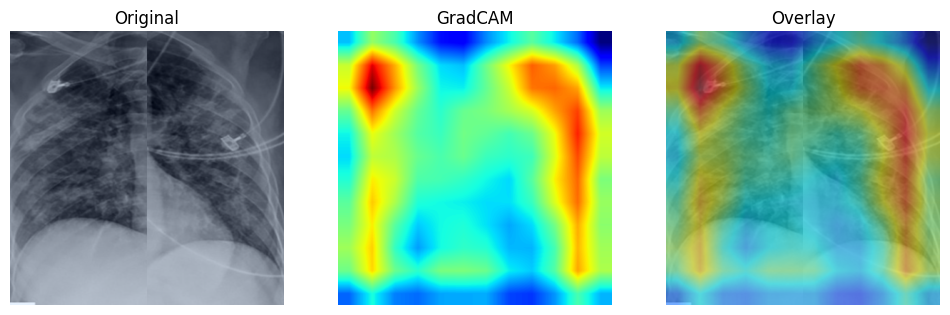

In [ ]:
show_gradcam(model, test_ds, idx=10)

# **PLOT LEARNING CURVE**

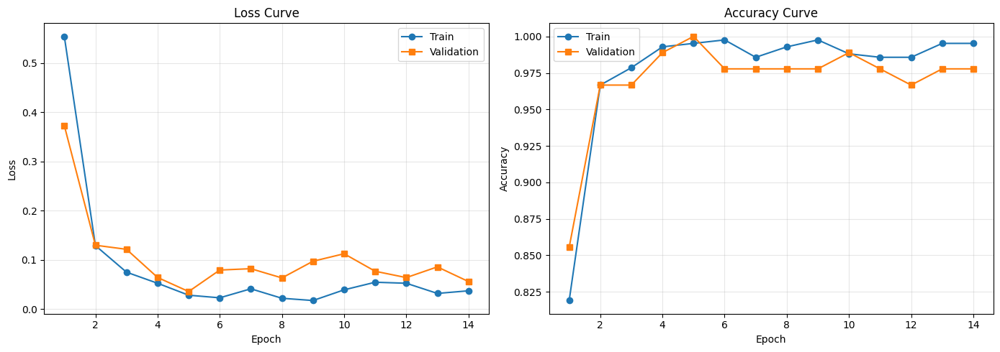

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history["train_loss"]) + 1)

fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# ===== LOSS =====
ax[0].plot(epochs, history["train_loss"], marker="o", label="Train")
ax[0].plot(epochs, history["val_loss"], marker="s", label="Validation")
ax[0].set_title("Loss Curve")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("Loss")
ax[0].legend()
ax[0].grid(alpha=0.3)

# ===== ACC =====
ax[1].plot(epochs, history["train_acc"], marker="o", label="Train")
ax[1].plot(epochs, history["val_acc"], marker="s", label="Validation")
ax[1].set_title("Accuracy Curve")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("Accuracy")
ax[1].legend()
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# **TEST**

In [ ]:
model.eval()

correct = 0
total = 0

with torch.no_grad():
    for x, disease_label, noise_label in test_loader:

        x = x.to(DEVICE)
        disease_label = disease_label.to(DEVICE)

        out = model(x)

        # ⭐ รองรับทั้ง multitask และ single head
        if isinstance(out, tuple):
            disease_pred = out[0]
        else:
            disease_pred = out

        pred = torch.argmax(disease_pred, 1)

        correct += (pred == disease_label).sum().item()
        total += disease_label.size(0)

print("TEST ACC =", correct / total)

TEST ACC = 1.0


In [ ]:
clean_correct = 0
clean_total = 0

noise_correct = 0
noise_total = 0

model.eval()
with torch.no_grad():
    for x, disease_label, noise_label in test_loader:

        x = x.to(DEVICE)
        disease_label = disease_label.to(DEVICE)

        out = model(x)

        # ⭐ รองรับทั้ง multitask และ single head
        if isinstance(out, tuple):
            disease_pred = out[0]
        else:
            disease_pred = out

        pred = torch.argmax(disease_pred, 1)

        # ⭐ vectorized split clean / noise
        clean_mask = (noise_label == 0)
        noise_mask = (noise_label == 1)

        clean_total += clean_mask.sum().item()
        noise_total += noise_mask.sum().item()

        clean_correct += (pred[clean_mask].cpu() == disease_label[clean_mask].cpu()).sum().item()
        noise_correct += (pred[noise_mask].cpu() == disease_label[noise_mask].cpu()).sum().item()

# ⭐ safe divide
clean_acc = clean_correct / clean_total if clean_total > 0 else 0
noise_acc = noise_correct / noise_total if noise_total > 0 else 0

print("Clean ACC =", clean_acc)
print("Noise ACC =", noise_acc)

Clean ACC = 1.0
Noise ACC = 1.0


# **Visualize Test Results**

In [ ]:
def visualize_all_test_results(model, device, dataset, title="Test Results"):

    model.eval()

    loader = DataLoader(dataset, batch_size=32, shuffle=False)

    all_images = []
    all_preds = []
    all_labels = []
    all_noise = []

    with torch.no_grad():
        for images, disease_labels, noise_labels in loader:

            images = images.to(device)

            out = model(images)

            # ⭐ รองรับทั้ง multitask และ single head
            if isinstance(out, tuple):
                disease_pred = out[0]
            else:
                disease_pred = out

            preds = disease_pred.argmax(dim=1)

            all_images.append(images.cpu())
            all_preds.append(preds.cpu())
            all_labels.append(disease_labels)
            all_noise.append(noise_labels)

    images = torch.cat(all_images)
    preds = torch.cat(all_preds)
    disease_labels = torch.cat(all_labels)
    noise_labels = torch.cat(all_noise)

    n = len(dataset)
    cols = 5
    rows = math.ceil(n / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
    fig.suptitle(title, fontsize=18)

    axes = axes.flatten()

    for i in range(n):

        img = images[i].permute(1,2,0).numpy()

        # ⭐ normalize image
        img = img - img.min()
        img = img / (img.max() + 1e-8)

        correct = preds[i] == disease_labels[i]
        color = "green" if correct else "red"

        noise_text = "Noise" if noise_labels[i] == 1 else "Clean"

        axes[i].imshow(img)
        axes[i].set_title(
            f"{noise_text}\nP: {dataset.classes[int(preds[i])]}\nA: {dataset.classes[int(disease_labels[i])]}",
            color=color,
            fontsize=8
        )

        for spine in axes[i].spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(2)

        axes[i].axis("off")

    for j in range(n, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

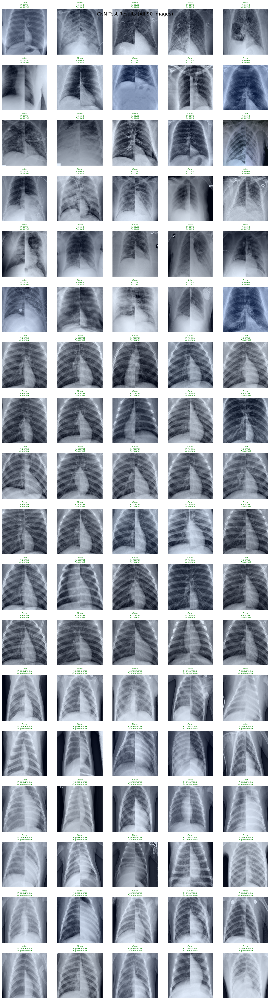

In [ ]:
visualize_all_test_results(
    model,
    DEVICE,
    test_ds,
    title="CNN Test Results (All 90 Images)"
)

# **CONFUSION MATRIX**

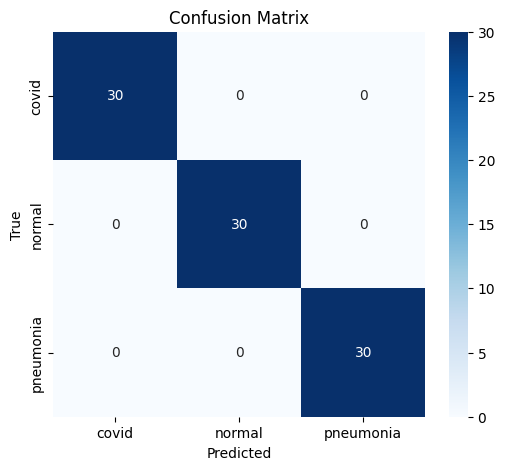

              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        30
      normal       1.00      1.00      1.00        30
   pneumonia       1.00      1.00      1.00        30

    accuracy                           1.00        90
   macro avg       1.00      1.00      1.00        90
weighted avg       1.00      1.00      1.00        90



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

y_true = []
y_pred = []

model.eval()
with torch.no_grad():
    for x, disease_label, noise_label in test_loader:

        x = x.to(DEVICE)

        out = model(x)

        # ⭐ รองรับ multitask / single task
        if isinstance(out, tuple):
            disease_pred = out[0]
        else:
            disease_pred = out

        pred = torch.argmax(disease_pred, 1).cpu().numpy()

        y_pred.extend(pred)
        y_true.extend(disease_label.numpy())

# ===== CONFUSION MATRIX =====
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=test_ds.classes,
    yticklabels=test_ds.classes
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# ===== CLASSIFICATION REPORT =====
print(classification_report(y_true, y_pred, target_names=test_ds.classes))

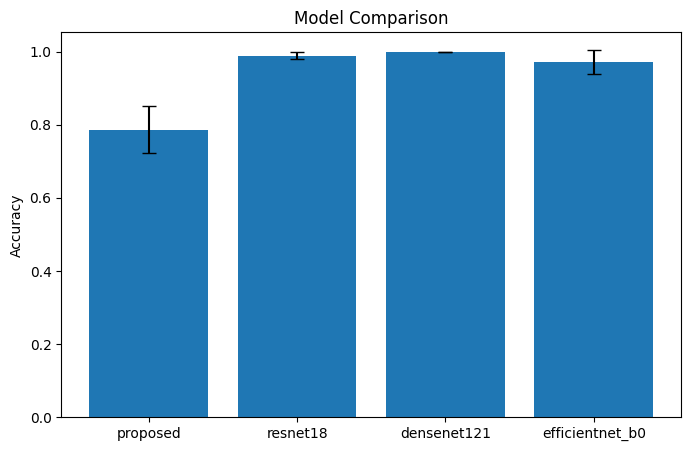

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

models = list(results.keys())
accs = [results[m]["mean_acc"] for m in models]
stds = [results[m]["std_acc"] for m in models]

plt.figure(figsize=(8,5))
plt.bar(models, accs, yerr=stds, capsize=5)
plt.title("Model Comparison")
plt.ylabel("Accuracy")
plt.show()